<a href="https://colab.research.google.com/github/muhamadfarrelrizqullah/PCVK_Ganjil_2023/blob/main/Week3_Mfarrel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Praktikum 3 PCVK**


Akses folder images pada Google Drive Anda dengan kode berikut:

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Melakukan transformasi linier brightness dengan memasukkan nilai konstanta tertentu dan
menghasilkan warna. Seperti yang telah dibahas pada ulasan teori, formula untuk melakukan
transformasi linier brightness adalah sebagai berikut:

𝑔(𝑥, 𝑦) = 𝑓(𝑥, 𝑦) + 𝑏

dimana g(x,y) adalah nilai pixel setelah transformasi, f(x,y) adalah nilai pixel asli, dan b adalah
nilai brightness.
Tuliskan potongan kode berikut untuk mengimplementasikan linier brightness pada google
colab:

masukkan nilai kecerahan : 70


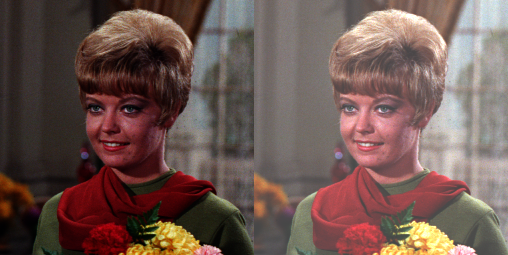

In [9]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

try:
  brightness=int(input('masukkan nilai kecerahan : '))
except ValueError:
  print('error, not a number')

original =cv2.imread('/content/drive/MyDrive/Pcvk/female.tiff')
brightness_image = np.zeros(original.shape,original.dtype)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y,x,c]=np.clip(original[y,x,c] + brightness,0,255)

final_frame=cv2.hconcat ((original,brightness_image))
cv2_imshow(final_frame)

**Tugas Praktikum 3 PCVK**


Implementasikan inverse citra pada Google Colaboratory menggunakan formula yang
terdapat pada bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:

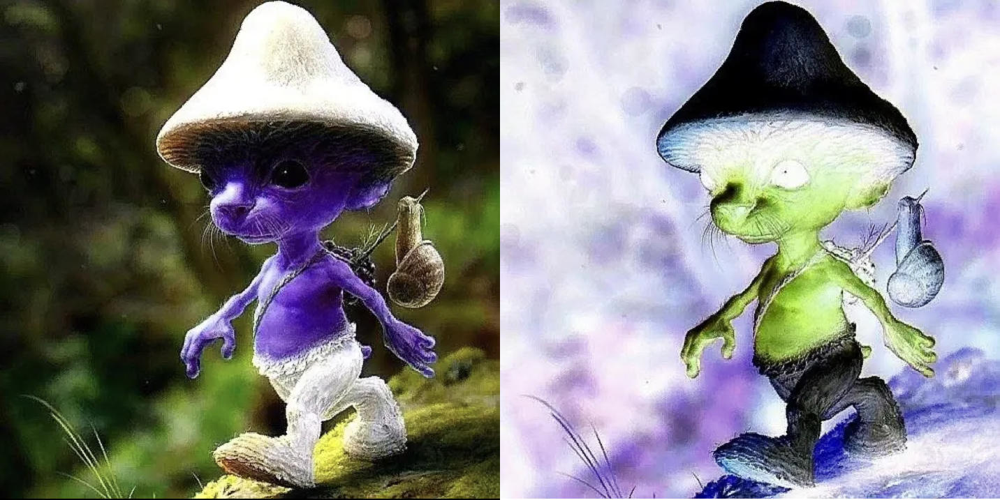

In [19]:
# Menggunakan fungsi bawaan openCV
path='/content/drive/MyDrive/Pcvk/laah.jpg'
image=cv2.imread(path)
inverted_image = cv2.bitwise_not(image)

invertedFrame=cv2.hconcat((image,inverted_image))
cv2_imshow(invertedFrame)

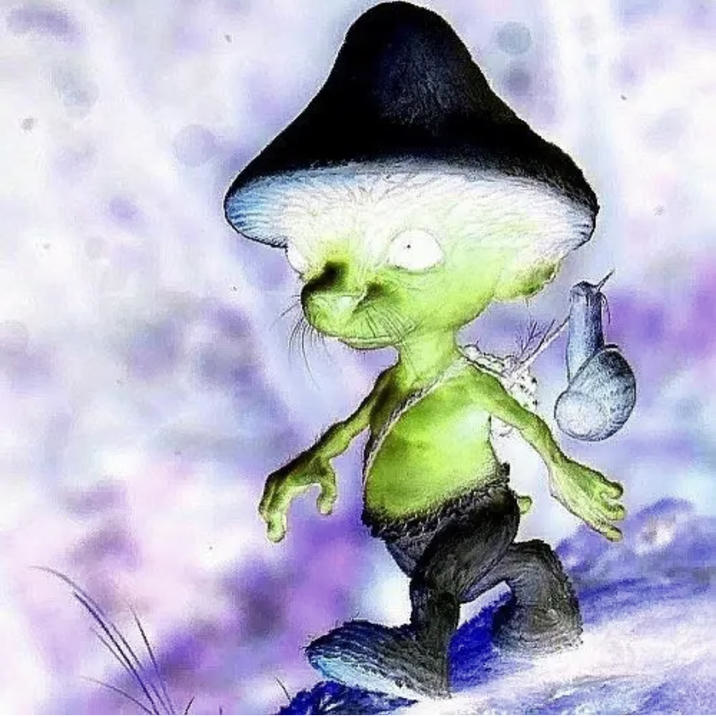

In [14]:
# Menggunakan rumus untuk invert image
path='/content/drive/MyDrive/Pcvk/laah.jpg'
image = cv2.imread(path)
invert = np.zeros(image.shape,image.dtype)
for y in range(image.shape[0]):
    for x in range(image.shape[1]):
        for c in range(image.shape[2]):
            invert[y,x,c]=np.clip(255 - image[y,x,c] ,0,255)

cv2_imshow(invert)

Implementasikan transformasi contrast pada Google Colaboratory menggunakan
formula yang terdapat pada bagian Ulasan Teori untuk kontras, sehingga
menghasilkan keluaran seperti berikut:

masukkan nilai kecerahan [-255 , 255] : 60
masukkan nilai kontrast [1.0 - 3.0] : 3


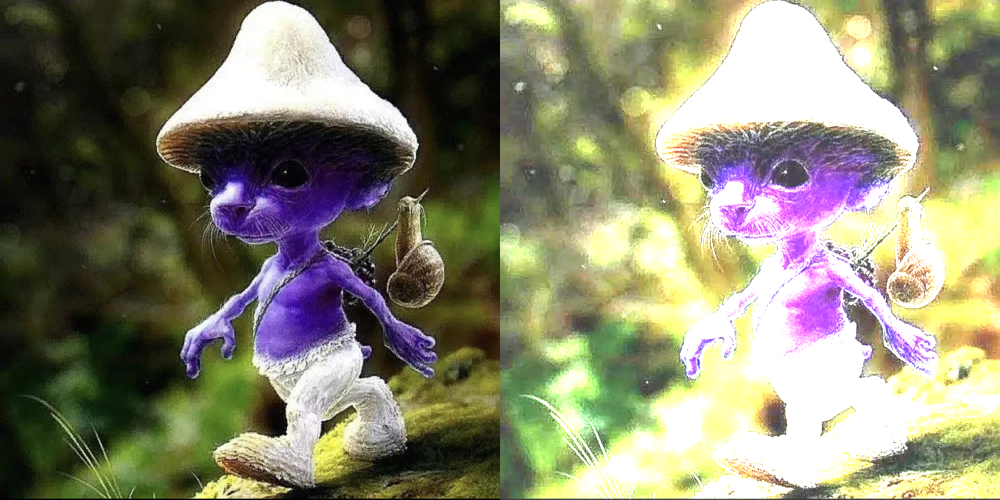

In [18]:
# Menggunakan rumus transformasi contrast
imagePath='/content/drive/MyDrive/Pcvk/laah.jpg'
try:
  brightness=int(input('masukkan nilai kecerahan [-255 , 255] : '))
  contrast=int(input('masukkan nilai kontrast [1.0 - 3.0] : '))
except ValueError:
  print('error, not a number')

original =cv2.imread(imagePath)
brightness_image = np.zeros(original.shape,original.dtype)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y,x,c]=np.clip(contrast * original[y,x,c] + brightness,0,255)

final_frame=cv2.hconcat ((original,brightness_image))
cv2_imshow(final_frame)

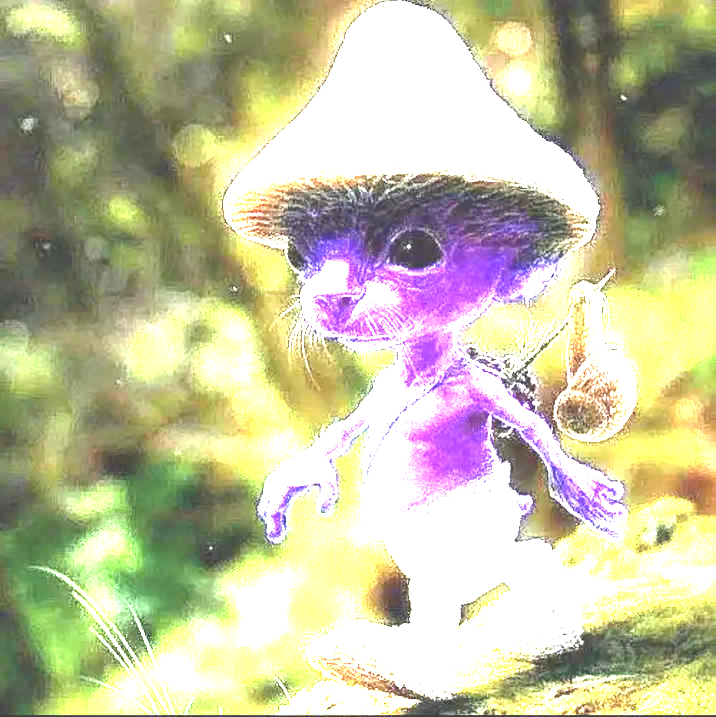

In [20]:
# Menggunakan fungsi bawaan openCv
editedImage=cv2.convertScaleAbs(original, alpha=contrast, beta=brightness)
cv2_imshow(editedImage)

Implementasikan transformasi logarithmic brightness pada Google Colaboratory
menggunakan formula yang terdapat pada bagian Ulasan Teori untuk transformasi
log, sehingga menghasilkan keluaran seperti berikut:

masukkan nilai kecerahan [-255 , 255] : 50


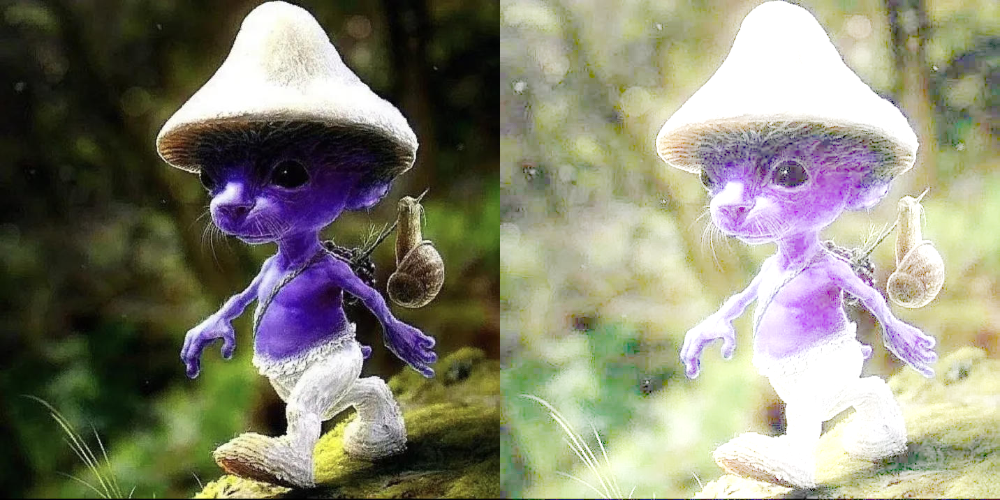

In [21]:
import numpy as np
def logaritmikBrightness(image,kecerahan):
    brightness_image = np.zeros(image.shape,image.dtype)

    for y in range(image.shape[0]):
        for x in range(image.shape[1]):
            for c in range(image.shape[2]):
                brightness_image[y,x,c]=np.clip(kecerahan * np.log(1 + original[y,x,c]),0,255)

    return brightness_image

try:
  brightness=int(input('masukkan nilai kecerahan [-255 , 255] : '))
except ValueError:
  print('error, not a number')

converted= logaritmikBrightness(original,brightness)
final_frame=cv2.hconcat ((original,converted))
cv2_imshow(final_frame)

Implementasikan transformasi grayscale menggunakan metode averaging, lightness,
dan luminance pada Google Colaboratory menggunakan formula yang terdapat pada
bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:

<ipython-input-25-0c89ca6b11e1>:11: RuntimeWarning: overflow encountered in ubyte_scalars
  average = (red + green + blue) / 3


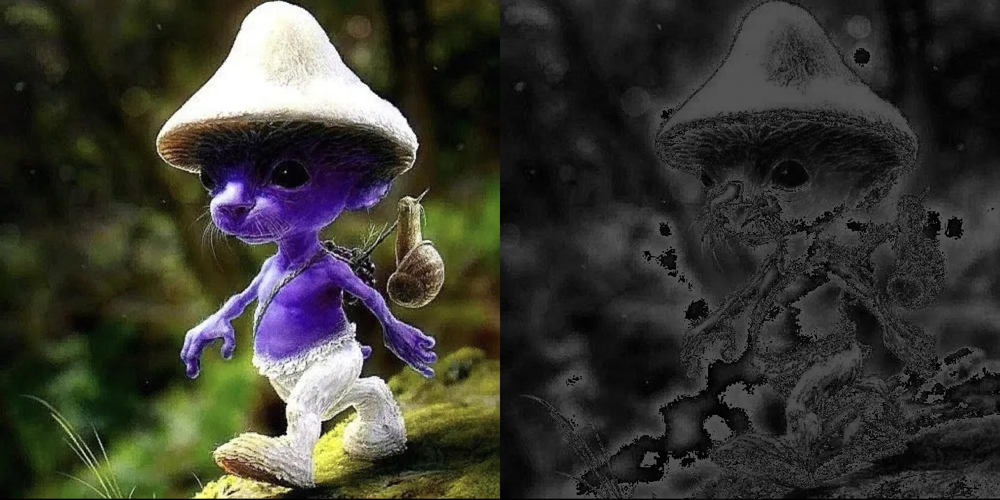

In [25]:
# Averaging
def averageBrightness(image):
    brightness_image = np.zeros(image.shape,image.dtype)

    for ye in range(image.shape[0]):
        for xe in range(image.shape[1]):
            for c in range(image.shape[2]):
                red = image[ye, xe, 2]  # Saluran merah (indeks 2)
                green = image[ye, xe, 1]  # Saluran hijau (indeks 1)
                blue = image[ye, xe, 0]  # Saluran biru (indeks 0)
                average = (red + green + blue) / 3
                brightness_image[ye, xe, c] = np.clip(average, 0, 255)
    return brightness_image

path='/content/drive/MyDrive/Pcvk/laah.jpg'
img = cv2.imread(path)
converted= averageBrightness(img)

final_frame=cv2.hconcat ((img,converted))
cv2_imshow(final_frame)

<ipython-input-26-f46737b0d695>:11: RuntimeWarning: overflow encountered in ubyte_scalars
  maxmin=(max(red,green,blue)+min(red,green,blue))/2


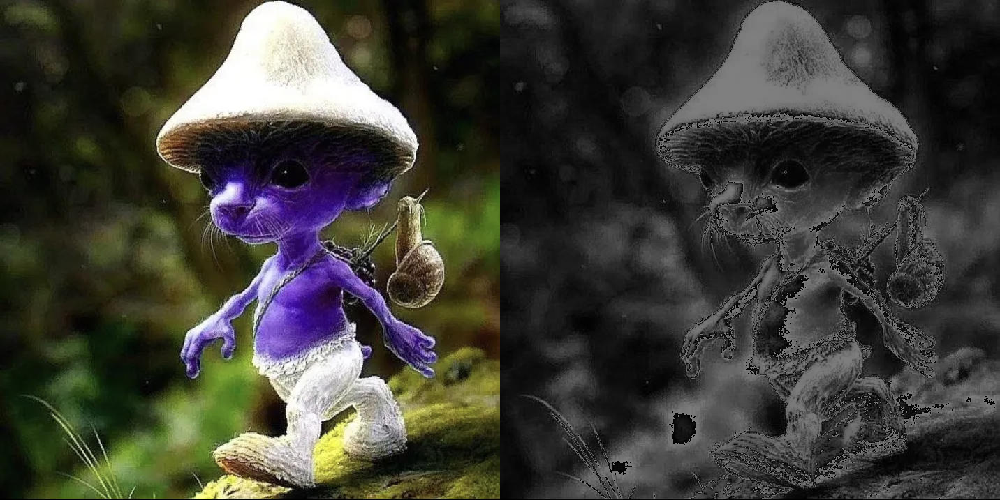

In [26]:
# Lightness
def grayscaleLightness(image):
    brightness_image = np.zeros(image.shape,image.dtype)

    for ye in range(image.shape[0]):
        for xe in range(image.shape[1]):
            for c in range(image.shape[2]):
                red = image[ye, xe, 2]  # Saluran merah (indeks 2)
                green = image[ye, xe, 1]  # Saluran hijau (indeks 1)
                blue = image[ye, xe, 0]  # Saluran biru (indeks 0)
                maxmin=(max(red,green,blue)+min(red,green,blue))/2
                brightness_image[ye, xe, c] = np.clip(maxmin, 0, 255)
    return brightness_image

path='/content/drive/MyDrive/Pcvk/laah.jpg'
img = cv2.imread(path)
converted= grayscaleLightness(img)

final_frame=cv2.hconcat ((img,converted))
cv2_imshow(final_frame)

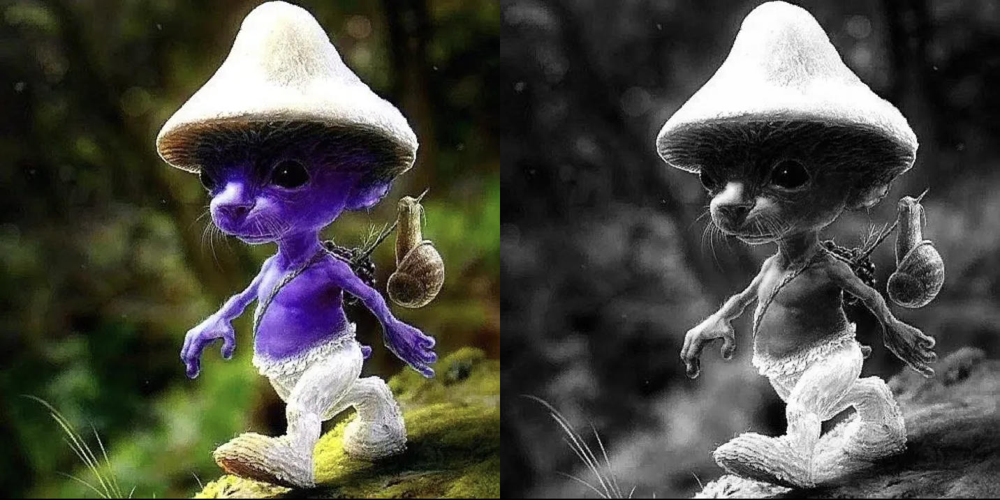

In [27]:
# Luminance
def grayscaleLuminance(image):
    brightness_image = np.zeros(image.shape,image.dtype)

    for ye in range(image.shape[0]):
        for xe in range(image.shape[1]):
            for c in range(image.shape[2]):
                red = image[ye, xe, 2]*0.21  # Saluran merah (indeks 2)
                green = image[ye, xe, 1]*0.72  # Saluran hijau (indeks 1)
                blue = image[ye, xe, 0]*0.07  # Saluran biru (indeks 0)
                maxmin=red+green+blue
                brightness_image[ye, xe, c] = np.clip(maxmin, 0, 255)
    return brightness_image

path='/content/drive/MyDrive/Pcvk/laah.jpg'
img = cv2.imread(path)
converted= grayscaleLuminance(img)

final_frame=cv2.hconcat ((img,converted))
cv2_imshow(final_frame)

Tampilkanlah warna tertentu pada citra, dan ubah warna lain menjadi grayscale. Misal,
tampilkan warna biru pada citra masukan dan ubah bagian lain yang tidak berwarna
biru menjadi grayscale seperti pada contoh berikut:

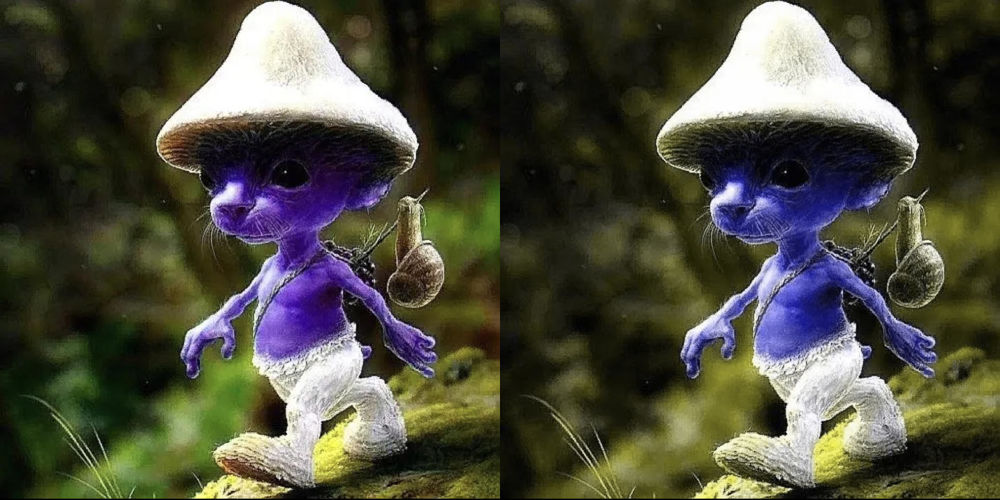

In [28]:
def grayscalePilihan(image):
    grayscale_image = np.zeros(image.shape,image.dtype)


    for ye in range(image.shape[0]):
        for xe in range(image.shape[1]):
            red = image[ye, xe, 2]*0.21  # Saluran merah (indeks 2)
            green = image[ye, xe, 1]*0.72  # Saluran hijau (indeks 1)
            blue = image[ye, xe, 0]*0.07  # Saluran biru (indeks 0)

            maxmin=red+green+blue

            grayscale_image[ye, xe, 0] = image[ye, xe, 0]# Saluran biru
            grayscale_image[ye, xe, 1] = np.clip(maxmin, 0, 255) # Saluran hijau
            grayscale_image[ye, xe, 2] = np.clip(maxmin, 0, 255)  # Saluran merah

    return grayscale_image

path='/content/drive/MyDrive/Pcvk/laah.jpg'
img = cv2.imread(path)
converted= grayscalePilihan(img)

final_frame=cv2.hconcat ((img,converted))
cv2_imshow(final_frame)